# Assignment 9

n this assignment, you learn how to use matrix product states (MPS) to compress fully
connected layers and perform simple MPS contractions.

1. Instead of compressing a weight matrix of a fully connected layer, we will consider the compression of a large image, which can also be nicely visualized.
2. Write a method that compresses the image by transforming it to a matrix product state with a fixed bond dimension D.
3. Write a function that transforms the MPS back to the original dimensions.
4. Calculate the number of parameters in the compressed MPS. Visually compare the obtained MPS compressed image with the simple SVD compressed image with the same number of parameters.
5. Analyze the compression factor and the error of the compression as a function of the bond dimension, namely the size of the matrices in the MPS. Compare the errors obtained with the MPS and SVD compressed images as a function of the compression factor. Why is the MPS compression better? Isn’t SVD an optimal decomposition concerning the 2-norm?


In [1]:
# Import all dependencies
import numpy as np

from PIL import Image
import matplotlib.pyplot as plt

### Data Retrieval and Preprocessing


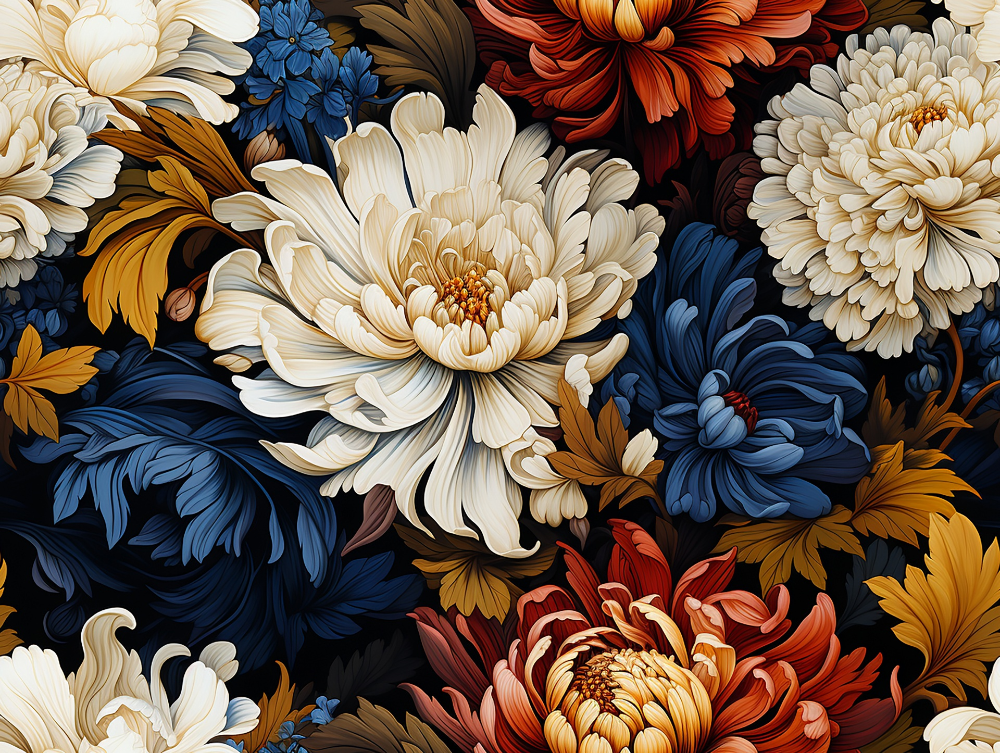

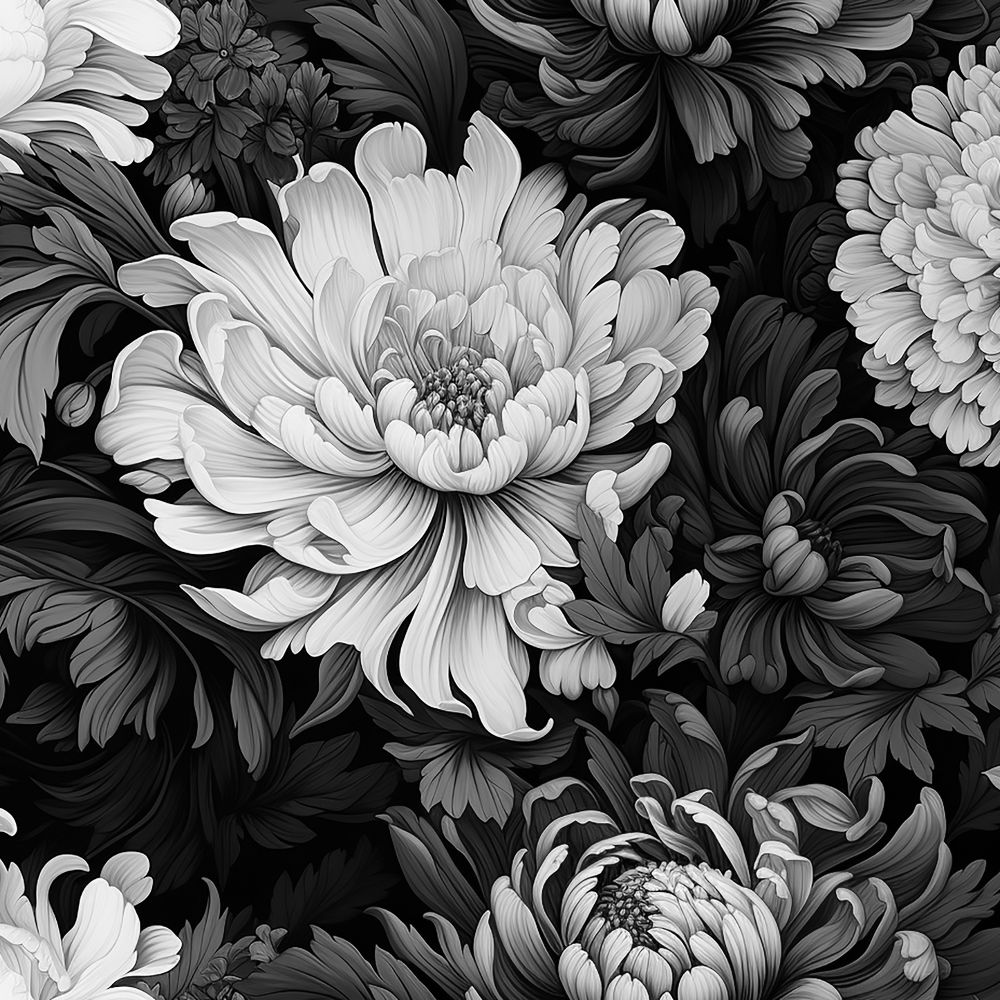

In [2]:
# Download the image from https://www.publicdomainpictures.net/pictures/540000/velka/seamless-flowers-pattern-16952868310zL.jpg
# Open the image
image = Image.open("./data/image.jpg")
display(image)

# Convert the image into a grayscale image
image = image.convert("L")

# Save the original image size
original_width = image.width
original_height = image.height

# Resize the image so the height will be 4096 pixels
image = image.resize((int(image.width * (4096 / image.height)), 4096))

# Save the current image size
current_width = image.width
current_height = image.height

# Calculate the coordinates to crop the image to 4096x4096 pixels
x = int((current_width - 4096) / 2)
y = int((current_height - 4096) / 2)

# Crop the image to 4096x4096 pixels in the center
image = image.crop((x, y, x + 4096, y + 4096))
display(image)

# Convert the image into a numpy 16952868310zLarray
data = np.array(image)

### Data Analyzing


Basic Image Information:
Size: (4096, 4096)
Mode: L


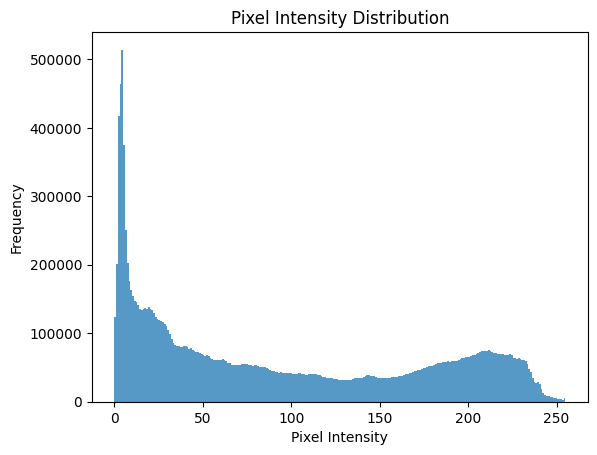

In [3]:
# Basic image information
image_info = {
    "Size": image.size,
    "Mode": image.mode,
}

print("Basic Image Information:")
for key, value in image_info.items():
    print(f"{key}: {value}")

# Plot histogram
plt.hist(
    data.flatten(),
    bins=256,
    alpha=0.75,
)
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.title("Pixel Intensity Distribution")
plt.show()

### Image to MPS


In [4]:
def data_to_mps(data: np.ndarray, n: int) -> np.ndarray:
    # Copy the data
    data = data.copy()

    # Reshape the 2D array into a tensor of size 2, 2, ..., 2
    data = np.reshape(data, [2] * n)

    # Transpose the tensor in such way that indices are in the order of [0, 12, 1, 13, 2, 14, ..., 11, 23]
    data = np.transpose(
        data,
        np.concatenate(
            [
                np.arange(n // 2).reshape(-1, 1),
                np.arange(n // 2).reshape(-1, 1) + n // 2,
            ],
            axis=1,
        ).flatten(),
    )

    # Reshape the tensor by combining the even and odd indices
    data = np.reshape(data, [4] * (n // 2))

    return data

### MPS to image


In [5]:
def mps_to_data(data: np.ndarray, n: int) -> np.ndarray:
    # Copy the data
    data = data.copy()

    # Rename the input tensor
    data = data

    # Reshape the tensor by splitting the even and odd indices
    data = np.reshape(data, [2] * n)

    # Transpose the tensor in such way that indices are in the order of [0, 2, 4, ..., 22, 1, 3, 5, ..., 23]
    data = np.transpose(data, np.concatenate([np.arange(0, n, 2), np.arange(1, n, 2)]))

    # Reshape the tensor into a 2D array
    data = np.reshape(data, [2 ** (n // 2)] * 2)

    return data

### MPS Compression


In [6]:
def mps_compression(data: np.ndarray, dimension: int) -> (np.ndarray, int):
    # Copy the data
    data = data.copy()

    # Define the number of dimensions
    N = 24

    # Convert data to mps
    print("Converting data to matrix product state...")
    data = data_to_mps(data, N)
    print("MPS shape:", data.shape)

    # Start the compression
    print("Starting compression...")
    matrices = []
    for index in range(N // 2 - 1):
        # Reshape the data into a matrix
        T = np.reshape(data, [-1, 4 ** (11 - index)])

        # Perform SVD
        U, S, V = np.linalg.svd(T, full_matrices=False)

        # Calculate the number of singular values to keep
        k = min(dimension, len(S))

        # Take the first k singular values and vectors
        U = U[:, :k]
        U = np.reshape(U, [-1, 4, k])
        S = np.diag(S[:k])
        V = V[:k, :]

        # Save the U matrix
        print("Matrix shape:", U.shape)
        matrices.append(U)

        # Multiply the S and V matrices
        data = np.einsum("ij,jk->ik", S, V)

    # Calculate and save the final matrix
    final = np.reshape(data, (4, 4, 1))
    print("Matrix shape:", final.shape)
    matrices.append(final)

    # The compression is done
    print("Compression done!")

    # Concatenate the matrices
    print("Concatenating matrices...")
    compressed_matrices = np.array([[1]])
    for index in range(len(matrices)):
        # Concatenate the matrices
        compressed_matrices = np.einsum(
            "...i,ijk->...jk", compressed_matrices, matrices[index]
        )
        print("Matrix shape:", compressed_matrices.shape)

    # Remove the first and last dimensions
    compressed_matrices = np.squeeze(compressed_matrices)
    print("Matrix shape:", compressed_matrices.shape)

    # The concatenation is done
    print("Concatenation done!")

    # Convert the mps back to data
    print("Converting matrix product state to data...")
    data = mps_to_data(compressed_matrices, N)
    print("Data shape:", data.shape)

    # Calculate the number of MPS parameters
    parameters = np.sum([np.prod(matrix.shape) for matrix in matrices])
    print("Number of MPS parameters:", parameters)

    return data, parameters

### SVD Compression


In [7]:
def svd_compression(data: np.ndarray, parameters: int) -> (np.ndarray, int):
    # Copy the data
    data = data.copy()

    # Define the number of dimensions
    N = 24

    # Perform SVD
    print("Performing SVD...")
    U, S, V = np.linalg.svd(data, full_matrices=False)
    print("Singular values shape:", S.shape)

    # Calculate the number of singular values to keep
    dimension = int(parameters / (2 ** (N // 2 + 1)))
    print("Number of singular values to keep:", dimension)

    # Set the singular values to zero
    S[dimension:] = 0

    # Reconstruct the data
    print("Reconstructing data...")
    compressed_data = np.dot(U, np.dot(np.diag(S), V))

    return compressed_data, dimension

### Example on the real image


In [8]:
# Perform the MPS compression
mps_compressed_data, mps_parameters = mps_compression(data, dimension=64)

# Perform the SVD compression
svd_compressed_data, svd_parameters = svd_compression(data, mps_parameters)

Converting data to matrix product state...
MPS shape: (4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4)
Starting compression...
Matrix shape: (1, 4, 4)
Matrix shape: (4, 4, 16)
Matrix shape: (16, 4, 64)
Matrix shape: (64, 4, 64)
Matrix shape: (64, 4, 64)
Matrix shape: (64, 4, 64)
Matrix shape: (64, 4, 64)
Matrix shape: (64, 4, 64)
Matrix shape: (64, 4, 64)
Matrix shape: (64, 4, 16)
Matrix shape: (16, 4, 4)
Matrix shape: (4, 4, 1)
Compression done!
Concatenating matrices...
Matrix shape: (1, 4, 4)
Matrix shape: (1, 4, 4, 16)
Matrix shape: (1, 4, 4, 4, 64)
Matrix shape: (1, 4, 4, 4, 4, 64)
Matrix shape: (1, 4, 4, 4, 4, 4, 64)
Matrix shape: (1, 4, 4, 4, 4, 4, 4, 64)
Matrix shape: (1, 4, 4, 4, 4, 4, 4, 4, 64)
Matrix shape: (1, 4, 4, 4, 4, 4, 4, 4, 4, 64)
Matrix shape: (1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 64)
Matrix shape: (1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 16)
Matrix shape: (1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4)
Matrix shape: (1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1)
Matrix shape: (4, 4, 4, 4, 4, 4, 4, 4, 4

In [9]:
# Calculate the compression factor
print("Calculating the compression factor...")
mps_compression_factor = 1 - mps_parameters / np.prod(data.shape)
svd_compression_factor = 1 - svd_parameters / data.shape[0]
print("MPS compression factor:", mps_compression_factor)
print("SVD compression factor:", svd_compression_factor)

# Calculating the compression error
print("Calculating the compression error...")
mps_compression_error = np.linalg.norm(data - mps_compressed_data) / np.linalg.norm(
    data
)
svd_compression_error = np.linalg.norm(data - svd_compressed_data) / np.linalg.norm(
    data
)
print("MPS compression error:", mps_compression_error)
print("SVD compression error:", svd_compression_error)

Calculating the compression factor...
MPS compression factor: 0.9936199188232422
SVD compression factor: 0.996826171875
Calculating the compression error...
MPS compression error: 0.1865656335128715
SVD compression error: 0.3174781410617677


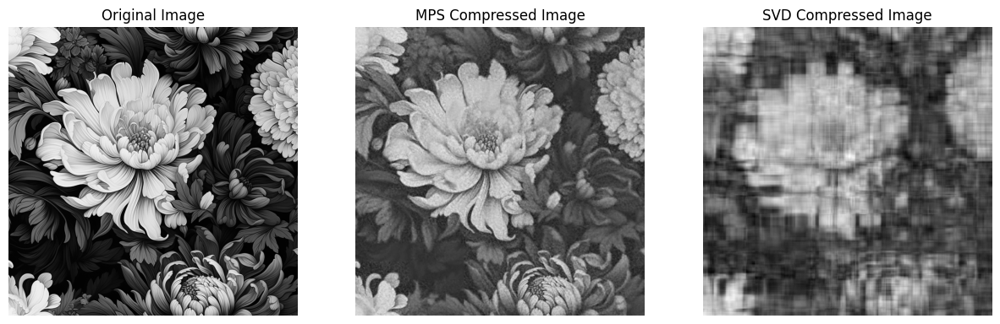

In [10]:
# Plot the original image, the MPS compressed image and the SVD compressed image
_, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
ax1.imshow(data, cmap="gray")
ax1.set_title("Original Image")
ax1.set_axis_off()
ax2.imshow(mps_compressed_data, cmap="gray")
ax2.set_title("MPS Compressed Image")
ax2.set_axis_off()
ax3.imshow(svd_compressed_data, cmap="gray")
ax3.set_title("SVD Compressed Image")
ax3.set_axis_off()
plt.show()

### Analysis


In [11]:
# Perform analysis for different values of d
dimension_values = [2**i for i in range(2, 10)]
mps_compression_factors = []
svd_compression_factors = []
mps_compression_errors = []
svd_compression_errors = []

for dimension in dimension_values:
    # Perform the MPS compression
    mps_compressed_data, mps_parameters = mps_compression(data, dimension)

    # Perform the SVD compression
    svd_compressed_data, svd_parameters = svd_compression(data, mps_parameters)

    # Calculate the compression factor
    mps_compression_factors.append(1 - mps_parameters / np.prod(data.shape))
    svd_compression_factors.append(1 - svd_parameters / data.shape[0])

    # Calculating the compression error
    mps_compression_errors.append(
        np.linalg.norm(data - mps_compressed_data) / np.linalg.norm(data)
    )
    svd_compression_errors.append(
        np.linalg.norm(data - svd_compressed_data) / np.linalg.norm(data)
    )

Converting data to matrix product state...
MPS shape: (4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4)
Starting compression...
Matrix shape: (1, 4, 4)
Matrix shape: (4, 4, 4)
Matrix shape: (4, 4, 4)
Matrix shape: (4, 4, 4)
Matrix shape: (4, 4, 4)
Matrix shape: (4, 4, 4)
Matrix shape: (4, 4, 4)
Matrix shape: (4, 4, 4)
Matrix shape: (4, 4, 4)
Matrix shape: (4, 4, 4)
Matrix shape: (4, 4, 4)
Matrix shape: (4, 4, 1)
Compression done!
Concatenating matrices...
Matrix shape: (1, 4, 4)
Matrix shape: (1, 4, 4, 4)
Matrix shape: (1, 4, 4, 4, 4)
Matrix shape: (1, 4, 4, 4, 4, 4)
Matrix shape: (1, 4, 4, 4, 4, 4, 4)
Matrix shape: (1, 4, 4, 4, 4, 4, 4, 4)
Matrix shape: (1, 4, 4, 4, 4, 4, 4, 4, 4)
Matrix shape: (1, 4, 4, 4, 4, 4, 4, 4, 4, 4)
Matrix shape: (1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4)
Matrix shape: (1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4)
Matrix shape: (1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4)
Matrix shape: (1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1)
Matrix shape: (4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4)
Concatenation do

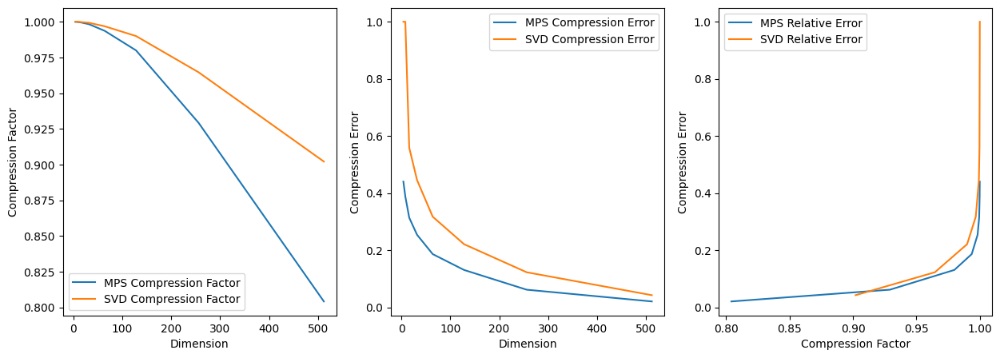

In [12]:
# Plot the compression factors and the compression errors
_, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
ax1.plot(dimension_values, mps_compression_factors, label="MPS Compression Factor")
ax1.plot(dimension_values, svd_compression_factors, label="SVD Compression Factor")
ax1.set_xlabel("Dimension")
ax1.set_ylabel("Compression Factor")
ax1.legend()
ax2.plot(dimension_values, mps_compression_errors, label="MPS Compression Error")
ax2.plot(dimension_values, svd_compression_errors, label="SVD Compression Error")
ax2.set_xlabel("Dimension")
ax2.set_ylabel("Compression Error")
ax2.legend()
ax3.plot(mps_compression_factors, mps_compression_errors, label="MPS Relative Error")
ax3.plot(svd_compression_factors, svd_compression_errors, label="SVD Relative Error")
ax3.set_xlabel("Compression Factor")
ax3.set_ylabel("Compression Error")
ax3.legend()
plt.show()

### Conclusion

In this assignment we learned how to use matrix product states (MPS) to compress fully connected layers and perform simple MPS contractions. We have seen that the MPS compression is better than the SVD compression. The latter is also presented in the plot, where we compare the original image with the MPS ans SVD compressed images. The MPS compression is better because it is a more general form of the SVD compression. The SVD is a special case of the MPS, where the bond dimension is equal to the rank of the matrix.

We confirmed that the MPS compression is better than the SVD compression by comparing the errors obtained with the MPS and SVD compressed images as a function of the compression factor.
